In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dogs-vs-cats/test1.zip
/kaggle/input/dogs-vs-cats/train.zip
/kaggle/input/dogs-vs-cats/sampleSubmission.csv


<h1 style="text-align:center; color:#6A5ACD; font-weight:bold; font-size:38px;">Image Classification With TensorFlow</h1>


<div style="text-align: center;">
    <img src="https://www.shutterstock.com/image-photo/portrait-adorable-labrador-puppy-scottish-600nw-2379672403.jpg" alt="Centered Image">
</div>

# 🐶🐱 Dogs vs. Cats Dataset  

## 📌 Introduction  
The **Dogs vs. Cats** dataset is a well-known dataset from Kaggle, designed for binary image classification. It consists of images of **dogs** and **cats**, making it ideal for training deep learning models, especially **Convolutional Neural Networks (CNNs)**.  

---

## 📂 Dataset Details  
- **Total Images**: 25,000  
- **Categories**:  
  - 🐶 `dog`  
  - 🐱 `cat`  
- **Image Format**: `.jpg`  
- **Image Size**: Varies (not uniform)  
- **Labels**:  
  - The filenames contain the class labels (e.g., `dog.1.jpg`, `cat.2.jpg`).  
  - No separate label file; labels are inferred from filenames.  

---

## 📊 Data Organization  
The dataset is typically divided into:  
- **Training Set**: Used for model training.  
- **Validation/Test Set**: Used to assess model performance.  

---

## 🛠️ How to Use the Dataset  

✔️ **Image Classification Tasks**: Build models to classify images as dogs or cats.  
✔️ **Deep Learning (CNNs & Transfer Learning)**: Train **Convolutional Neural Networks (CNNs)** or apply **pre-trained models** like VGG16, ResNet, or EfficientNet for improved accuracy.  
✔️ **Data Augmentation & Preprocessing**: Apply techniques like **resizing, normalization, flipping, and rotation** to enhance model generalization.  

---

## 🔗 Dataset Link  
📥 **[Download from Kaggle](https://www.kaggle.com/competitions/dogs-vs-cats/data)**  

---

💡 *This dataset is perfect for image classification projects and deep learning experiments!* 🚀  


<h1 style="text-align:left; color:#6A5ACD; font-weight:bold; font-size:28px; font-family:Arial, sans-serif;">Import Libraries</h1>

In [86]:
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os, shutil
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import load_img, img_to_array


SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)


#Remove Warnings
import warnings
warnings.filterwarnings('ignore')

<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Reading The Data</b></div>

## Unzipping the Dogs vs. Cats Dataset

In [3]:
!unzip -q "/kaggle/input/dogs-vs-cats/train.zip"

In [4]:
!unzip -q "/kaggle/input/dogs-vs-cats/test1.zip"

## Prepare Data

In [5]:
def prepare_data(train_path, val_size=0.15, test_size=0.15, random_state=42):

    train_filenames = os.listdir(train_path)
    train_categories = [1 if filename.split(".")[0] == 'dog' else 0 for filename in train_filenames]

    df = pd.DataFrame({
        'filename': train_filenames,
        'category': train_categories
    })

    
    train_df, temp_df = train_test_split(df, test_size=(val_size + test_size), stratify=df["category"], random_state=random_state)

    val_ratio = val_size / (val_size + test_size)  
    val_df, test_df = train_test_split(temp_df, test_size=(1 - val_ratio), stratify=temp_df["category"], random_state=random_state)

    return train_df, val_df, test_df

In [6]:
train_path = "/kaggle/working/train"
train_df, val_df, test_df = prepare_data(train_path)
print(f"Total Training Images: {len(train_df)}")
print(f"Total Validation Images: {len(val_df)}")
print(f"Total Test Images: {len(test_df)}")

Total Training Images: 17500
Total Validation Images: 3750
Total Test Images: 3750


In [7]:
train_df.head()

,filename,category
23829,dog.5933.jpg,1
21772,cat.7077.jpg,0
7695,dog.9815.jpg,1
13239,cat.6949.jpg,0
389,dog.4719.jpg,1


In [8]:
val_df.head()

,filename,category
1115,dog.9123.jpg,1
19920,cat.11829.jpg,0
20668,cat.1175.jpg,0
6752,cat.4580.jpg,0
12965,dog.4178.jpg,1


In [9]:
test_df.head()

,filename,category
21970,dog.3578.jpg,1
19954,cat.1953.jpg,0
24534,dog.3548.jpg,1
4685,cat.7092.jpg,0
13459,dog.10846.jpg,1


## Subsampled Dataset Directory Structure

The dataset is organized into **three main directories**: `train`, `validation`, and `test`, each containing images of cats and dogs.

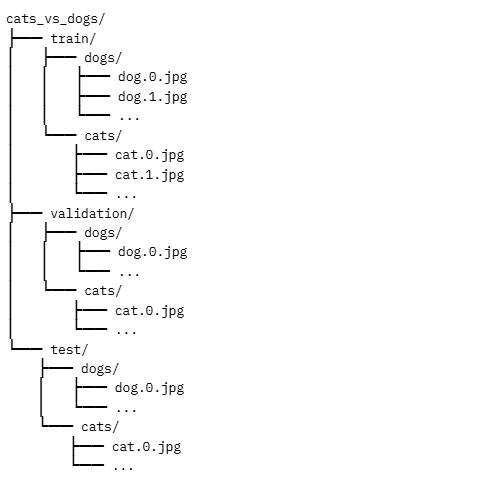

In [10]:
def subsampled_dataset(df, source_path, base_dir, dataset_type):
    dogs_dir = os.path.join(base_dir, dataset_type, "dogs")
    cats_dir = os.path.join(base_dir, dataset_type, "cats")
    os.makedirs(dogs_dir, exist_ok=True)
    os.makedirs(cats_dir, exist_ok=True)
    source_path = Path(source_path)

    for category, num, folder in [("cat", 0, cats_dir), ("dog", 1, dogs_dir)]:
        for i, filename in enumerate(df[df["category"] == num]["filename"]):
            src = source_path / filename
            dst = os.path.join(folder, f"{category}{i}.jpg") 
            shutil.copyfile(src, dst)



In [11]:
base_dir = "cats_vs_dogs"
subsampled_dataset(train_df, train_path, base_dir, "train")

In [12]:
subsampled_dataset(val_df, train_path, base_dir, "validation")

In [13]:
subsampled_dataset(test_df, train_path, base_dir, "test")

In [14]:
cats = len(os.listdir("/kaggle/working/cats_vs_dogs/train/cats"))
dogs = len(os.listdir("/kaggle/working/cats_vs_dogs/train/dogs"))
cats+dogs

17500

The number of training samples is **17,500**, so the total count of dogs and cats after subsampling is **17,500**.

## Show Sample From Train Data

In [15]:
def display_images(df, image_path, num_images=6):

    sample_data = df.sample(n=num_images).reset_index(drop=True)

    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    
    for i, ax in enumerate(axes):
        filename = sample_data.loc[i, "filename"]
        img = Image.open(os.path.join(image_path, filename))

        img = img.resize((128, 128))
        
        label = "Dog" if sample_data.loc[i, "category"] == 1 else "Cat"

        ax.imshow(img)
        ax.set_title(label, fontsize=20)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

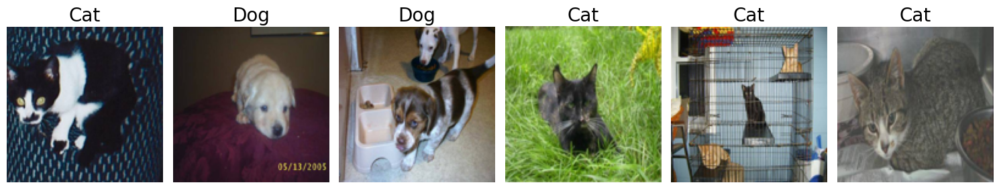

In [16]:
display_images(train_df, train_path)

<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Data Preprocessing</b></div>

## 📌 Preparing Image Data for a Deep Learning Model  

Before feeding data into a model, we need to **preprocess** it into floating-point tensors. Our dataset consists of **JPEG images**, so we must follow these steps:  

### ✅ Steps to Prepare Image Data:
1️⃣ **Read the image files** from disk.  
2️⃣ **Decode JPEG images** into RGB pixel grids.  
3️⃣ **Convert images** into floating-point tensors.  
4️⃣ **Resize** images to a uniform shape (e.g., **180 × 180**).  
5️⃣ **Batch** the images for efficient training (e.g., **batch size = 32**).  

### ⚡ Using `image_dataset_from_directory()`
Keras provides a **convenient function** called `image_dataset_from_directory()`, which automates these steps. It:  
🔹 Scans subdirectories and assigns labels automatically.  
🔹 Indexes and loads images efficiently.  
🔹 Decodes and resizes images.  
🔹 Packs images into shuffled batches, returning a **tf.data.Dataset**.  

With this approach, we can **seamlessly load and preprocess images** for deep learning models! 🚀  


In [17]:
new_base_dir = Path(base_dir)

In [18]:
#Training
train_dataset = image_dataset_from_directory(
    new_base_dir / "train",
    image_size=(180, 180),
    batch_size=32,
    shuffle=True,
    seed=42
)

Found 17500 files belonging to 2 classes.


In [19]:
#Validation
validation_dataset = image_dataset_from_directory(
    new_base_dir / "validation",
    image_size=(180, 180),
    batch_size=32,
    shuffle=True,
    seed=42
)

Found 3750 files belonging to 2 classes.


In [20]:
#Test
test_dataset = image_dataset_from_directory(
    new_base_dir / "test",
    image_size=(180, 180),
    batch_size=32,
    shuffle=True,
    seed=42
)

Found 3750 files belonging to 2 classes.


In [21]:
for data_batch, labels_batch in train_dataset:
    print("data batch shape:", data_batch.shape)   
    print("labels batch shape:", labels_batch.shape)
    break


data batch shape: (32, 180, 180, 3)
labels batch shape: (32,)


<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Building Model</b></div>

## Convolutional Neural Network (CNN) Architecture

The following diagram represents the architecture of our Convolutional Neural Network (CNN) used for image classification.

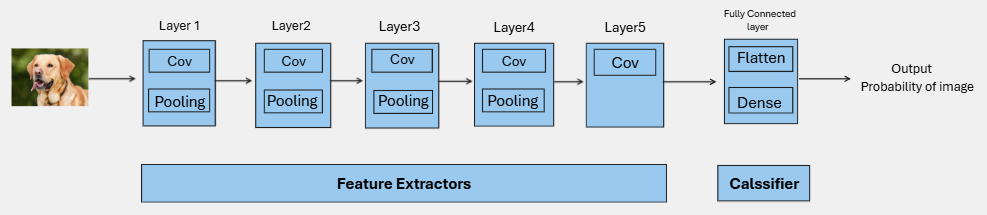

### **Architecture Breakdown:**
1. **Input Layer**  
   - The input is an image (e.g., a dog or cat) that enters the network.

2. **Feature Extractors**  
   - The CNN consists of multiple convolutional layers followed by pooling layers:
     - **Layer 1**: Convolution (Conv) + Pooling
     - **Layer 2**: Convolution (Conv) + Pooling
     - **Layer 3**: Convolution (Conv) + Pooling
     - **Layer 4**: Convolution (Conv) + Pooling
     - **Layer 5**: Convolution (Conv) (No pooling)
   - These layers extract meaningful features from the input image.

3. **Classifier**  
   - The extracted features are passed through a fully connected (dense) layer:
     - **Flatten**: Converts the feature maps into a 1D array.
     - **Dense**: Fully connected layer to learn complex patterns.

4. **Output Layer**  
   - A final layer provides the probability of the image belonging to a specific class (e.g., dog or cat).

This CNN is designed for efficient image classification by learning hierarchical features from raw image pixels. 🚀


In [22]:
inputs = keras.Input(shape=(180, 180, 3))  
x = layers.Rescaling(1./255)(inputs)     

# Conv Block 1
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)

# Conv Block 2
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)

# Conv Block 3
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)

# Conv Block 4
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)

# Conv Block 5
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)

# Flatten and Dense Layers
x = layers.Flatten()(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs=inputs, outputs=outputs)

In [23]:
model.compile(loss="binary_crossentropy",
      optimizer="rmsprop",
      metrics=["accuracy"])

In [24]:
callbacks = [
keras.callbacks.ModelCheckpoint(
 filepath="convnet_from_scratch.keras",
 save_best_only=True,
 monitor="val_loss")
 ]

In [25]:
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - accuracy: 0.5623 - loss: 0.6858 - val_accuracy: 0.7304 - val_loss: 0.5606
Epoch 2/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.7361 - loss: 0.5337 - val_accuracy: 0.7968 - val_loss: 0.4437
Epoch 3/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.7996 - loss: 0.4387 - val_accuracy: 0.8243 - val_loss: 0.4072
Epoch 4/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.8442 - loss: 0.3650 - val_accuracy: 0.8435 - val_loss: 0.3931
Epoch 5/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.8721 - loss: 0.2977 - val_accuracy: 0.8704 - val_loss: 0.3030
Epoch 6/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.9042 - loss: 0.2288 - val_accuracy: 0.8829 - val_loss: 0.3095
Epoch 7/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.9258 - loss: 0.1892 - val_accuracy: 0.8776 - val_loss: 0.3877
Epoch 8/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9445 - loss: 0.1387 - 

In [26]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 18, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 7, 7, 256)           │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │          12,545 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,982,084 (7.56 MB)

 Trainable params: 991,041 (3.78 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 991,043 (3.78 MB)

## Displaying curves of loss and accuracy during training

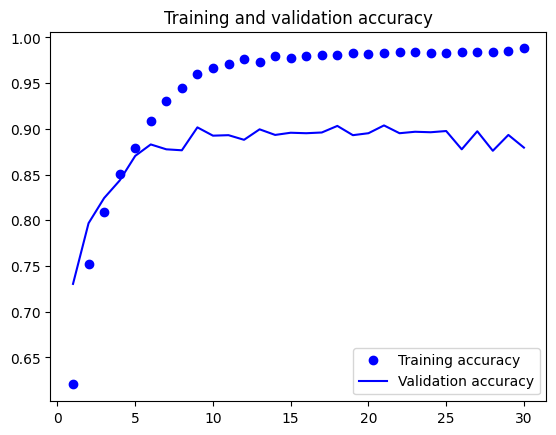

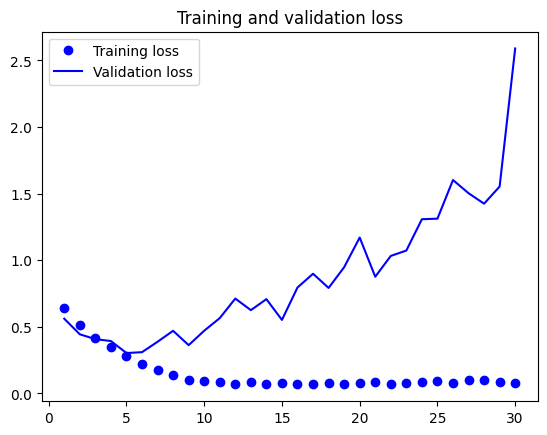

In [27]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

##  Evaluating the model on the test set

In [28]:
test_model = keras.models.load_model("convnet_from_scratch.keras")
test_loss, test_acc = test_model.evaluate(test_dataset) 
print(f"Test accuracy: {test_acc:.3f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.8689 - loss: 0.3054
Test accuracy: 0.868


## 📈 Training vs Validation Accuracy

The plot shows **training and validation accuracy** over **30 epochs**. 

#### 🔍 Observations:
- **Training accuracy** (dots) quickly reaches **98%**.
- **Validation accuracy** (line) improves but fluctuates around **90%**.
- A **gap** between them suggests **overfitting**.

### ⚠️ Possible Issues:
- The model may be **memorizing** training data.
- Fluctuations in validation accuracy indicate a need for **regularization**.

### ✅ Next Steps:
- Use **dropout** or **L2 regularization**.
- Apply **data augmentation** for more diversity.
- Implement **early stopping** to prevent overfitting.

This helps improve model generalization. 🚀


## Regularization with dropout

In [29]:
# Define the model with regularization
inputs = keras.Input(shape=(180, 180, 3))
x = layers.Rescaling(1./255)(inputs)

# Conv Block 1
x = layers.Conv2D(filters=32, kernel_size=3, activation=None)(x)  
x = layers.BatchNormalization()(x)  # Batch normalization
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.3)(x) # Dropout

# Conv Block 2
x = layers.Conv2D(filters=64, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 3
x = layers.Conv2D(filters=128, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 4
x = layers.Conv2D(filters=256, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 5
x = layers.Conv2D(filters=256, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)

# Flatten and Dense Layers
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)  
outputs = layers.Dense(1, activation="sigmoid")(x)

model1 = keras.Model(inputs=inputs, outputs=outputs)

In [30]:
model1.compile(loss="binary_crossentropy",
      optimizer="rmsprop",
      metrics=["accuracy"])

In [31]:
callbacks = [
keras.callbacks.ModelCheckpoint(
 filepath="convnet_from_scratch1.keras",
 save_best_only=True,
 monitor="val_loss")
 ]

In [32]:
history = model1.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step - accuracy: 0.5770 - loss: 1.0610 - val_accuracy: 0.6664 - val_loss: 0.6161
Epoch 2/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - accuracy: 0.6871 - loss: 0.6698 - val_accuracy: 0.6907 - val_loss: 0.5889
Epoch 3/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.7449 - loss: 0.5585 - val_accuracy: 0.6200 - val_loss: 0.8540
Epoch 4/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - accuracy: 0.7789 - loss: 0.4947 - val_accuracy: 0.7277 - val_loss: 0.5664
Epoch 5/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.8016 - loss: 0.4583 - val_accuracy: 0.7659 - val_loss: 0.5781
Epoch 6/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - accuracy: 0.8234 - loss: 0.4099 - val_accuracy: 0.8043 - val_loss: 0.4209
Epoch 7/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - accuracy: 0.8432 - loss: 0.3627 - val_accuracy: 0.8408 - val_loss: 0.3618
Epoch 8/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - accuracy: 0.8595 - loss: 0.3380 - 

## Displaying curves of loss and accuracy with dropout during training

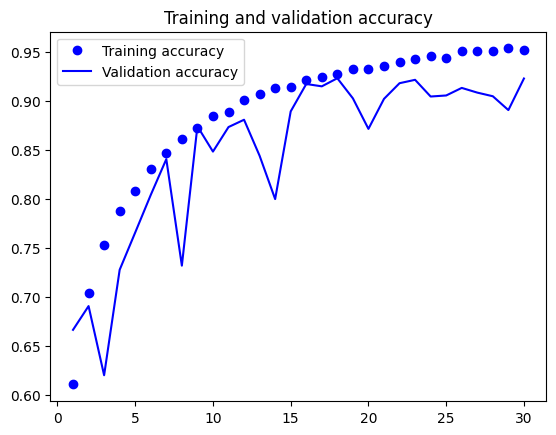

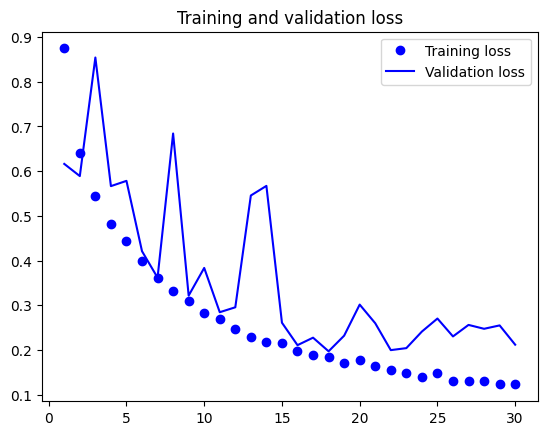

In [33]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

##  Evaluating the model with dropout on the test set

In [67]:
def plot_confusion_matrix(model, test_dataset, class_names=["cat", "dog"]):
    y_true = []
    y_pred = []
    
    for images, labels in test_dataset:
        preds = model.predict(images, verbose=0)
        # Convert probabilities to binary predictions (threshold = 0.5)
        preds_binary = (preds > 0.5).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds_binary)
    
    # Convert to numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=class_names, yticklabels=class_names)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()
    
    tn, fp, fn, tp = cm.ravel()
    print(f"True Negatives (cat as cat): {tn}")
    print(f"False Positives (cat as dog): {fp}")
    print(f"False Negatives (dog as cat): {fn}")
    print(f"True Positives (dog as dog): {tp}")

In [34]:
test_model = keras.models.load_model("convnet_from_scratch1.keras")
test_loss, test_acc = test_model.evaluate(test_dataset) 
print(f"Test accuracy: {test_acc:.3f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.9218 - loss: 0.1992
Test accuracy: 0.921


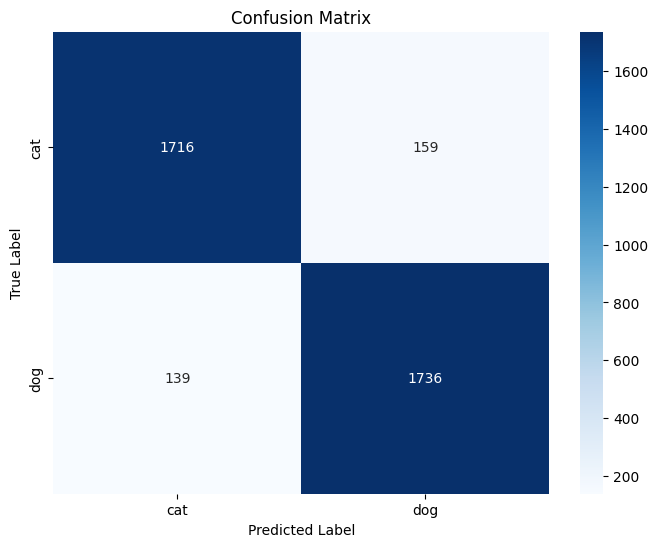

True Negatives (cat as cat): 1716
False Positives (cat as dog): 159
False Negatives (dog as cat): 139
True Positives (dog as dog): 1736


In [73]:
plot_confusion_matrix(keras.models.load_model("convnet_from_scratch1.keras"), test_dataset)

In [74]:
def display_predictions(model, test_dataset, class_names=["cat", "dog"], num_images=6):

    images, labels = next(iter(test_dataset))
    
    # Predict probabilities
    preds = model.predict(images, verbose=0)
    preds_binary = (preds > 0.5).astype(int).flatten()
    
    # Convert to numpy arrays
    images = images.numpy()
    labels = labels.numpy()
    
    # Set up the plot
    plt.figure(figsize=(15, 10))
    for i in range(min(num_images, len(images))):
        plt.subplot(2, 3, i + 1)  # 2 rows, 3 columns
        plt.imshow(images[i].astype("uint8"))  # Assuming images are normalized
        actual_label = class_names[labels[i]]
        pred_label = class_names[preds_binary[i]]
        # Set title color: green if correct, red if wrong
        title_color = "green" if actual_label == pred_label else "red"
        plt.title(f"Actual: {actual_label}\nPred: {pred_label}", color=title_color, fontsize=12)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

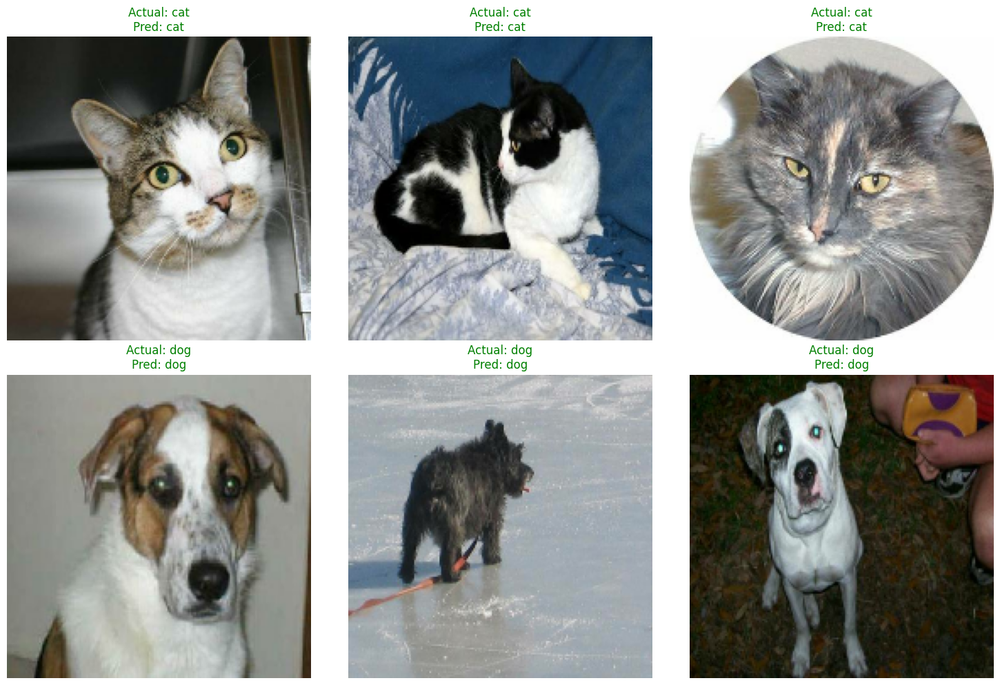

In [75]:
display_predictions(keras.models.load_model("convnet_from_scratch1.keras"), test_dataset)

## CNN Model Training Summary (with Dropout)  

- **Training Accuracy** reaches **~95%**, while **Validation Accuracy** fluctuates between **90-92%**, with a **Test Accuracy** of **92%**.  
- **Dropout (0.3, 0.4, 0.5)** effectively mitigates overfitting, though some generalization challenges persist.  
- **Possible Improvements**:  
  - Data Augmentation (if not already applied)  
  - Early Stopping to prevent overtraining  
  - Hyperparameter tuning for better generalization

🚀 **Conclusion**: The model delivers strong performance, but further refinements can enhance its stability and generalization. By optimizing key aspects such as data augmentation, early stopping, and hyperparameter tuning, we can push its accuracy and reliability even further!  


<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Data Augmentation</b></div>

## Data Augmentation Layers Overview  

Keras provides several **data augmentation** layers to enhance model generalization:  

- **`RandomFlip("horizontal")`**: Randomly flips images horizontally (50% probability).  
- **`RandomRotation(0.1)`**: Rotates images within a range of **±10%** of a full circle (**±36°**).  
- **`RandomZoom(0.2)`**: Randomly zooms images in or out by **±20%**.  

These augmentations help improve model robustness and **prevent overfitting**.  

In [35]:
data_augmentation = keras.Sequential(
    [
     layers.RandomFlip("horizontal"),
     layers.RandomRotation(0.1),
     layers.RandomZoom(0.2),
    ])

### Data Augmentation and Dropout in Model Training  

- **Data Augmentation** ensures the model never sees the exact same input twice, but since it only remixes existing data, it may not fully eliminate overfitting.   
- **Inference Behavior**:  
  - Like Dropout, data augmentation layers are **inactive** during inference.  
  - During evaluation (`predict()` or `evaluate()`), the model behaves as if data augmentation and Dropout were never applied.  

📌 **Key Takeaway**: Data augmentation and Dropout help improve generalization, but additional techniques may still be needed to prevent overfitting entirely.


## Displaying some randomly augmented training images

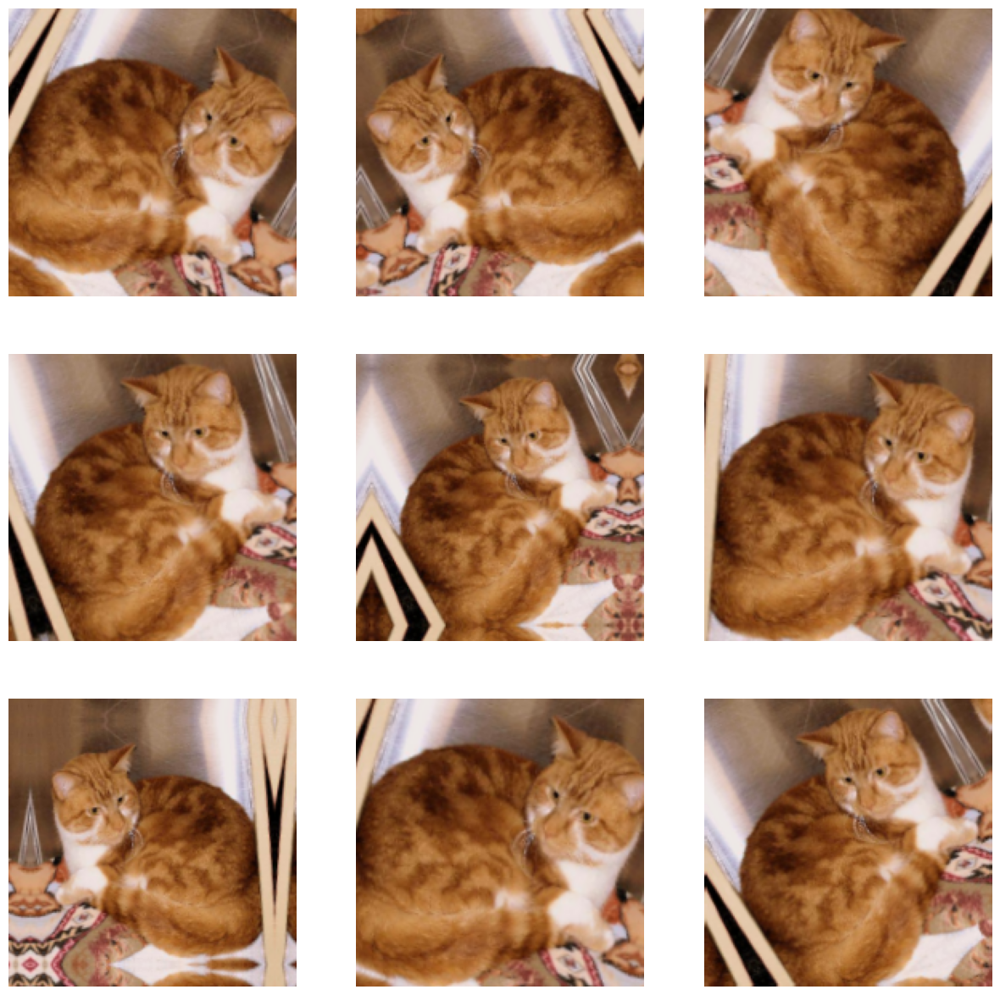

In [36]:
plt.figure(figsize=(15, 15)) 
for images, _ in train_dataset.take(1):   
    for i in range(9):
       augmented_images = data_augmentation(images)  
       ax = plt.subplot(3, 3, i + 1)
       plt.imshow(augmented_images[0].numpy().astype("uint8"))   
       plt.axis("off")

In [37]:
# Define the model with regularization
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)

# Conv Block 1
x = layers.Conv2D(filters=32, kernel_size=3, activation=None)(x)  
x = layers.BatchNormalization()(x)  # Batch normalization
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.3)(x) # Dropout

# Conv Block 2
x = layers.Conv2D(filters=64, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 3
x = layers.Conv2D(filters=128, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 4
x = layers.Conv2D(filters=256, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Dropout(0.4)(x)

# Conv Block 5
x = layers.Conv2D(filters=256, kernel_size=3, activation=None)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)

# Flatten and Dense Layers
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)  
outputs = layers.Dense(1, activation="sigmoid")(x)

model2 = keras.Model(inputs=inputs, outputs=outputs)

In [38]:
model2.compile(loss="binary_crossentropy",
      optimizer="rmsprop",
      metrics=["accuracy"])

In [39]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
    filepath="convnet_from_scratch_with_augmentation.keras",
    save_best_only=True,
     monitor="val_loss")
  ]

## Training the Model with Data Augmentation & Dropout  

- **Approach**: Utilize **data augmentation** and **dropout** to improve generalization.  
- **Expectation**: Overfitting is expected to occur much later in training.  
- **Training Strategy**: Increase the number of **epochs to 100** (3x the usual) to allow the model to learn effectively before overfitting.  

🚀 **Goal**: Achieve better model performance with improved generalization!

In [40]:
history = model2.fit(
    train_dataset,
    epochs=100,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - accuracy: 0.5692 - loss: 1.0734 - val_accuracy: 0.5616 - val_loss: 0.8888
Epoch 2/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.6507 - loss: 0.7293 - val_accuracy: 0.6379 - val_loss: 0.6637
Epoch 3/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.7082 - loss: 0.6049 - val_accuracy: 0.7443 - val_loss: 0.5278
Epoch 4/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.7355 - loss: 0.5487 - val_accuracy: 0.7736 - val_loss: 0.4771
Epoch 5/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.7691 - loss: 0.4976 - val_accuracy: 0.7819 - val_loss: 0.4576
Epoch 6/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.7812 - loss: 0.4626 - val_accuracy: 0.8032 - val_loss: 0.4252
Epoch 7/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.7940 - loss: 0.4474 - val_accuracy: 0.7651 - val_loss: 0.5139
Epoch 8/100
547/547 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.8023 - loss: 0

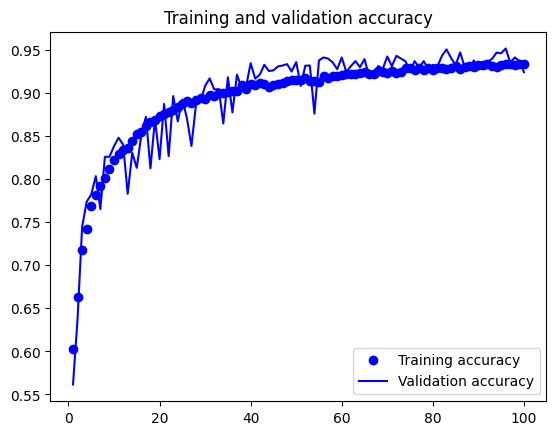

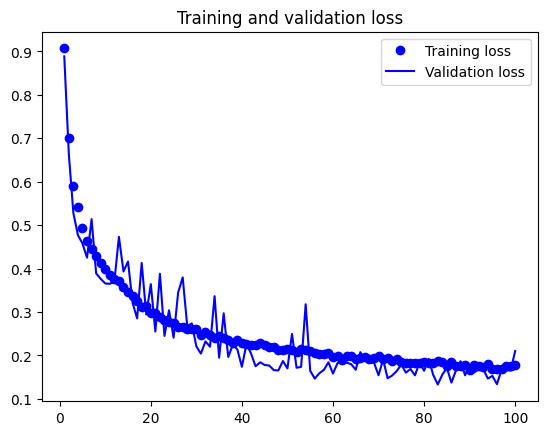

In [41]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [42]:
test_model = keras.models.load_model("convnet_from_scratch_with_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9515 - loss: 0.1114
Test accuracy: 0.951


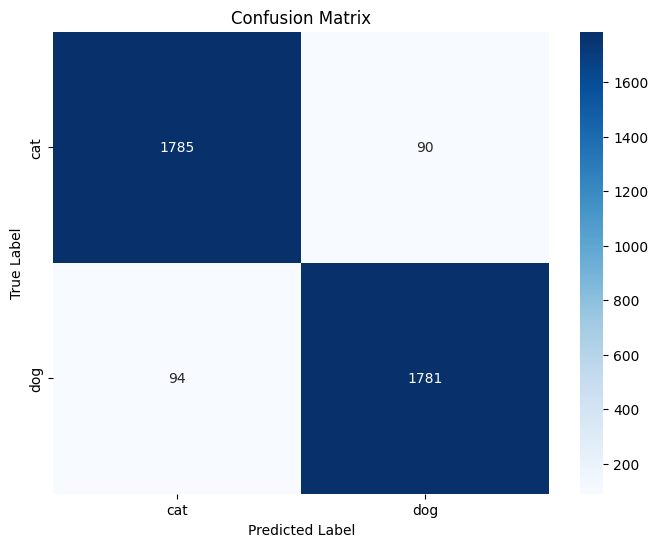

True Negatives (cat as cat): 1785
False Positives (cat as dog): 90
False Negatives (dog as cat): 94
True Positives (dog as dog): 1781


In [76]:
plot_confusion_matrix(keras.models.load_model("convnet_from_scratch_with_augmentation.keras"), test_dataset)

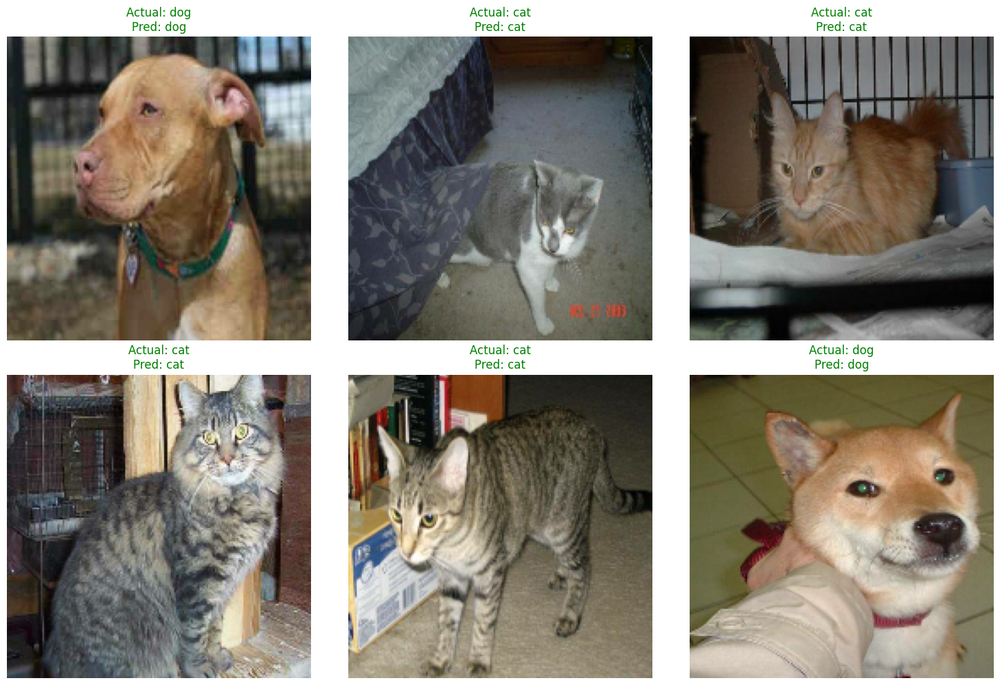

In [77]:
display_predictions(keras.models.load_model("convnet_from_scratch_with_augmentation.keras"), test_dataset)

## CNN Model Training Summary (with Data Augmentation)  

- **Strong Performance**: The model achieves **95.1% test accuracy**, showing effective learning.  
- **Data Augmentation Effect**: Likely helped improve generalization, preventing overfitting.  

### Next Step: Transfer Learning  
To further enhance performance, we will apply **transfer learning** by fine-tuning a **pretrained CNN**, leveraging powerful feature extraction from large datasets while allowing the model to adapt to our specific task and further improve accuracy.  


<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Transfer Learning</b></div>

## Using Pretrained Models for Small Image Datasets  

- **Pretrained Models**: Previously trained on large datasets (e.g., ImageNet).  
- **Benefit**: Leverages learned features for different tasks, even with different classes.  
- **Example**: ImageNet-trained model repurposed for **cats vs. dogs** classification.  
- **Chosen Model**: **VGG16** (developed in 2014, simple and effective).  
- **Two Approaches**:  
  1. **Feature Extraction**  
  2. **Fine-Tuning**  

🚀 **Next Step**: Implement **Feature Extraction** and **Fine-Tuning**!

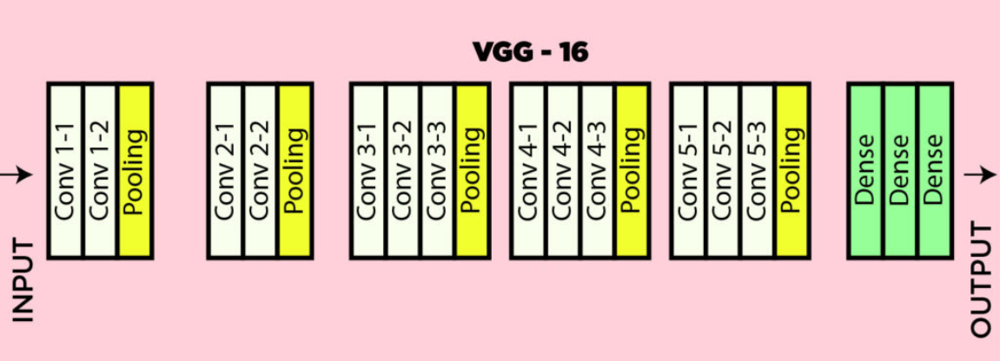

## Feature Extraction With Data Augmentation

### The model consists of three main stages:  

1. **Data Augmentation Stage**  
   - Applies random transformations to input images to improve generalization.  

2. **Frozen Convolutional Base**  
   - Uses a pretrained CNN (e.g., VGG16) with **frozen weights** to extract meaningful features.  
   - The **top classification layer is removed** and replaced with a new classifier.  

3. **Dense Classifier**  
   - A fully connected layer that maps extracted features to final class predictions (**Dog or Cat**).  

---

- The **convolutional base is frozen** to prevent its weights from being updated during training.  
- Freezing prevents large weight updates from destroying learned representations.  
- In Keras, we remove the top layer by setting `include_top = False`.  
- We then **add a new classification layer** specific to our task (**Dog or Cat**).  
- To freeze a layer, we set `trainable = False`.  


In [43]:
conv_base  = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [44]:
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 180, 180, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 180, 180, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 90, 90, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 90, 90, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 90, 90, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 45, 45, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 45, 45, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 45, 45, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 45, 45, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 22, 22, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 22, 22, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 22, 22, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 22, 22, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 11, 11, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 11, 11, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 11, 11, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 11, 11, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 5, 5, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [45]:
 conv_base.trainable = False

In [46]:
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)          
x = keras.applications.vgg16.preprocess_input(x)   
x = conv_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

model3 = keras.Model(inputs, outputs)


In [47]:
model3.compile(loss="binary_crossentropy",
      optimizer="rmsprop",
      metrics=["accuracy"])

In [48]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
    filepath="feature_extraction_with_data_augmentation.keras",
    save_best_only=True,
    monitor="val_loss")
 ]

In [49]:
history = model3.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - accuracy: 0.9132 - loss: 16.0666 - val_accuracy: 0.9779 - val_loss: 2.7755
Epoch 2/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9543 - loss: 3.0936 - val_accuracy: 0.9789 - val_loss: 0.5985
Epoch 3/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9544 - loss: 0.8097 - val_accuracy: 0.9824 - val_loss: 0.4186
Epoch 4/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9565 - loss: 0.6747 - val_accuracy: 0.9808 - val_loss: 0.3915
Epoch 5/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9597 - loss: 0.6471 - val_accuracy: 0.9757 - val_loss: 0.5817
Epoch 6/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9608 - loss: 0.7045 - val_accuracy: 0.9803 - val_loss: 0.6628
Epoch 7/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9605 - loss: 0.7699 - val_accuracy: 0.9776 - val_loss: 0.5862
Epoch 8/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9605 - loss: 0.7445 -

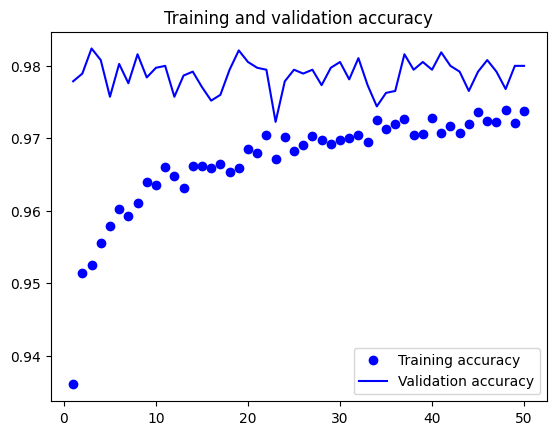

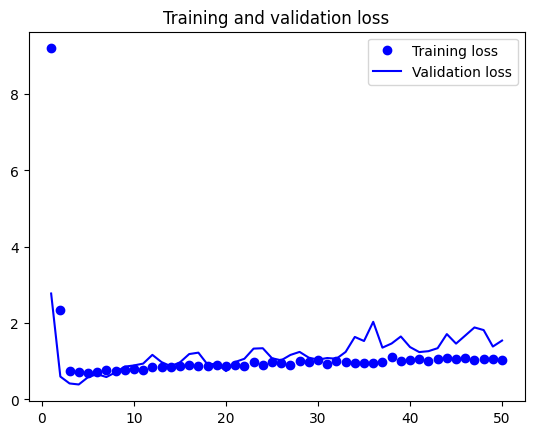

In [50]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [51]:
test_model = keras.models.load_model("feature_extraction_with_data_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9874 - loss: 0.2496
Test accuracy: 0.982


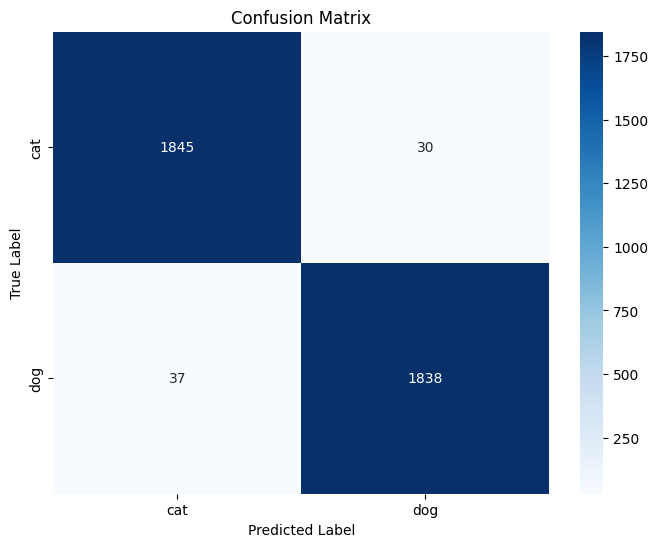

True Negatives (cat as cat): 1845
False Positives (cat as dog): 30
False Negatives (dog as cat): 37
True Positives (dog as dog): 1838


In [78]:
plot_confusion_matrix(keras.models.load_model("feature_extraction_with_data_augmentation.keras"), test_dataset)

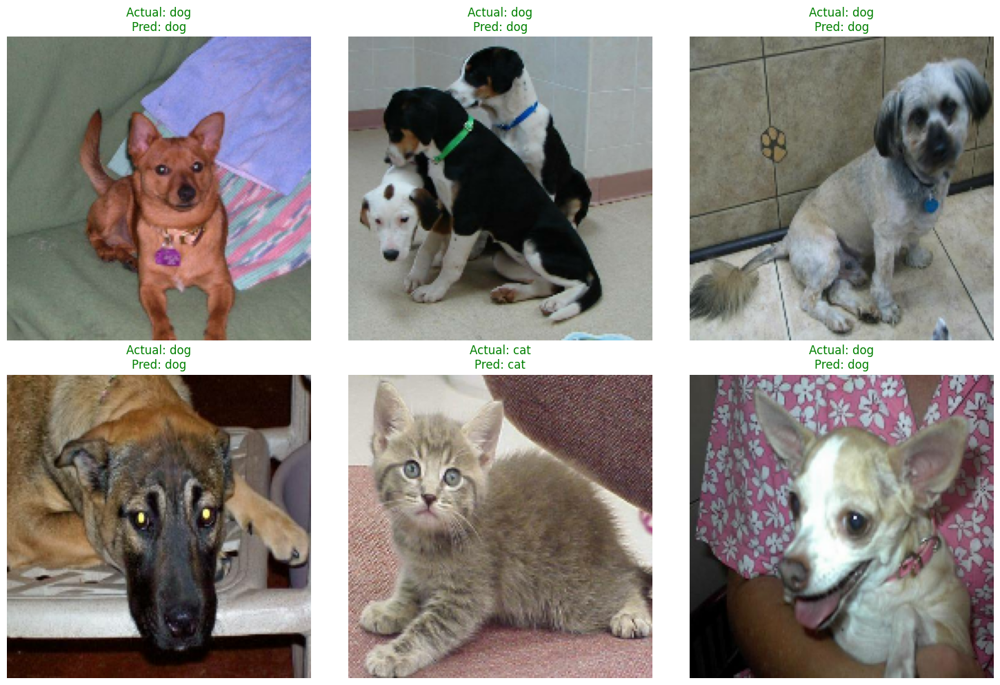

In [79]:
display_predictions(keras.models.load_model("feature_extraction_with_data_augmentation.keras"), test_dataset)

## Fine-Tuning

### Fine-Tuning Process  

1. **Add Custom Network**  
   - Place a new classification head on top of a pretrained base network.  

2. **Freeze the Base Network**  
   - Prevents weight updates to retain learned features.  

3. **Train the Custom Layers**  
   - Only the newly added layers are trained initially.  

4. **Unfreeze Some Base Layers**  
   - Fine-tune higher layers while keeping lower layers frozen.  
   - Avoid unfreezing **batch normalization** layers (not present in VGG16).  

5. **Joint Training**  
   - Train both the unfrozen base layers and the custom classifier together.  

We already completed the first three steps during feature extraction. Now, let's proceed with step 4:  
we’ll unfreeze the `conv_base` and then selectively freeze individual layers inside it.

### Why Not Fine-Tune the Entire Model?  
- **Lower layers** learn **generic features** (edges, textures) → already useful.  
- **Higher layers** learn **task-specific features** → benefit most from fine-tuning.  
- Fine-tuning too many layers **increases overfitting risk** (15M+ parameters in VGG16).

### Fine-Tuning Strategy  

- **Focus on fine-tuning the top 2-3 layers** to adapt high-level features for the new task.  
- **Keep lower layers frozen** to retain foundational patterns like edges and textures.  
- **Balances adaptation and generalization**, minimizing overfitting while improving performance.

### Fine-Tuning the Model  

- We begin **fine-tuning** using the **RMSprop optimizer** with a **very low learning rate**.  
- A low learning rate helps **limit modifications** to the representations of the fine-tuned layers.  
- **Large updates** may negatively impact learned features, so careful tuning is essential.  

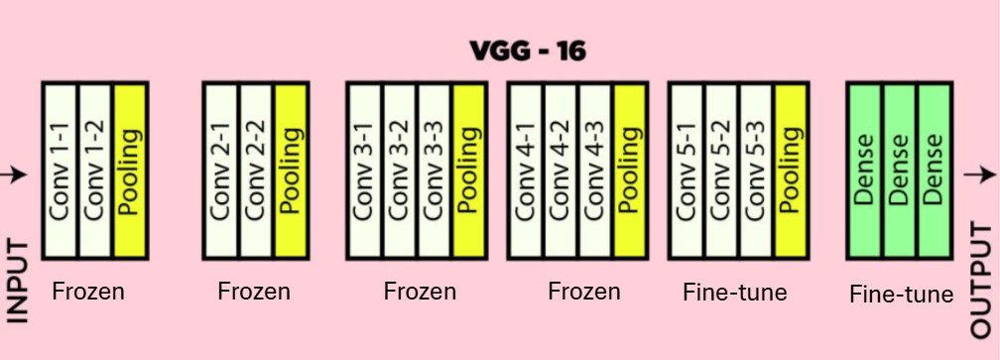

In [82]:
conv_base.trainable = True
for layer in conv_base.layers[:-8]:
    layer.trainable = False

In [83]:
model3.compile(loss="binary_crossentropy",
      optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
      metrics=["accuracy"])

In [84]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
    filepath="fine_tuning.keras",
    save_best_only=True,
    monitor="val_loss")
 ]

In [85]:
history = model3.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - accuracy: 0.9958 - loss: 0.0193 - val_accuracy: 0.9867 - val_loss: 0.2067
Epoch 2/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.9961 - loss: 0.0172 - val_accuracy: 0.9867 - val_loss: 0.2383
Epoch 3/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.9958 - loss: 0.0172 - val_accuracy: 0.9837 - val_loss: 0.2297
Epoch 4/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - accuracy: 0.9965 - loss: 0.0136 - val_accuracy: 0.9843 - val_loss: 0.2261
Epoch 5/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - accuracy: 0.9968 - loss: 0.0103 - val_accuracy: 0.9867 - val_loss: 0.2477
Epoch 6/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - accuracy: 0.9955 - loss: 0.0177 - val_accuracy: 0.9859 - val_loss: 0.2331
Epoch 7/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - accuracy: 0.9965 - loss: 0.0199 - val_accuracy: 0.9864 - val_loss: 0.2227
Epoch 8/30
547/547 ━━━━━━━━━━━━━━━━━━━━ 45s 82ms/step - accuracy: 0.9963 - loss: 0.0162 - 

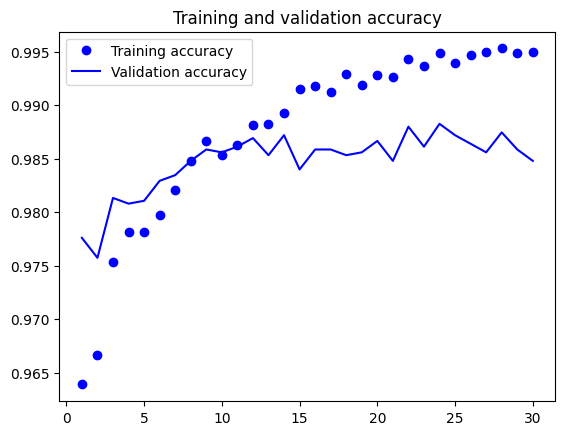

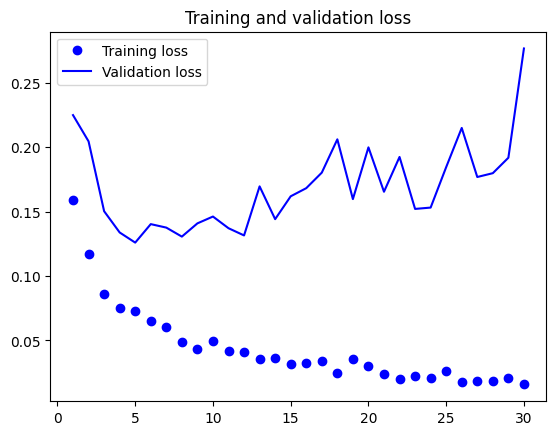

In [65]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [87]:
model = keras.models.load_model("fine_tuning.keras")
test_loss, test_acc = model.evaluate(test_dataset) 
print(f"Test accuracy: {test_acc:.3f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9887 - loss: 0.1339
Test accuracy: 0.987


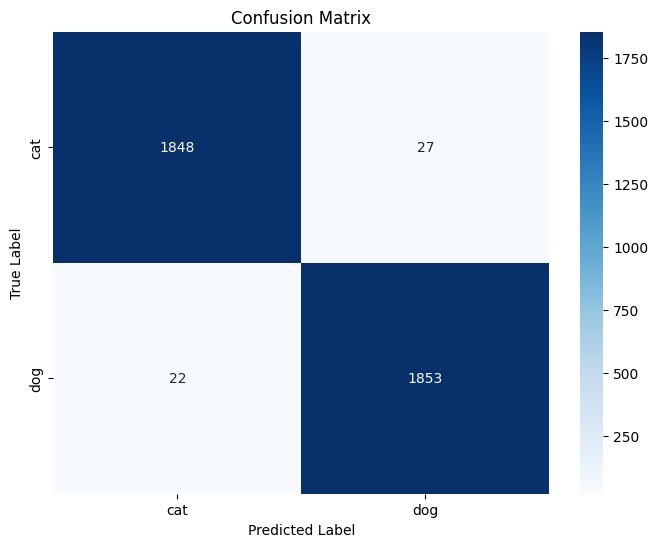

True Negatives (cat as cat): 1848
False Positives (cat as dog): 27
False Negatives (dog as cat): 22
True Positives (dog as dog): 1853


In [88]:
plot_confusion_matrix(keras.models.load_model("fine_tuning.keras"), test_dataset)

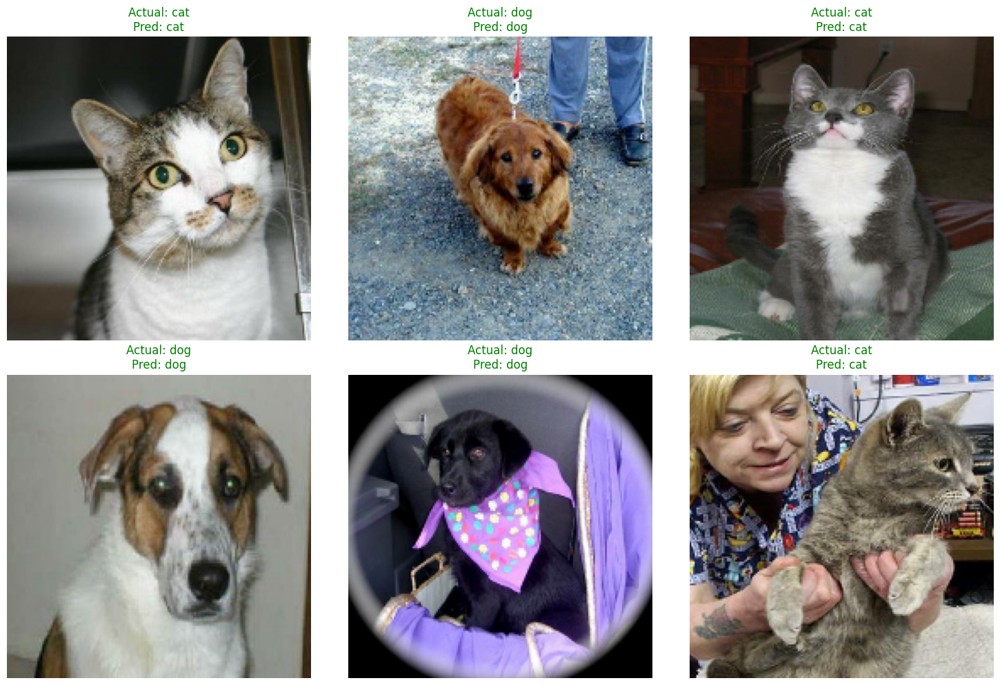

In [89]:
display_predictions(keras.models.load_model("fine_tuning.keras"), test_dataset)

<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Submission</b></div>

In [90]:
model = keras.models.load_model("fine_tuning.keras")
test_dir = "/kaggle/working/test1"

def load_test_images(test_dir, image_size=(180, 180)):
    image_ids = []
    images = []
    for filename in sorted(os.listdir(test_dir)):
        if filename.endswith(".jpg"):
            img_path = os.path.join(test_dir, filename)
            img = load_img(img_path, target_size=image_size)
            img_array = img_to_array(img) / 255.0
            images.append(img_array)
            image_ids.append(int(filename.split(".")[0]))
    return np.array(images), image_ids

test_images, test_ids = load_test_images(test_dir)
predictions = model.predict(test_images, batch_size=32, verbose=1)
predictions = (predictions > 0.5).astype(int).flatten()

submission_df = pd.DataFrame({"id": test_ids, "label": predictions})
submission_df = submission_df.sort_values(by="id")
submission_df.to_csv("/kaggle/working/submission.csv", index=False)

391/391 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step


<a id="1"></a>
# <div style="text-align:center; border-radius:25px 70px; padding:9px; color:white; margin:0; font-size:150%; font-family:Pacifico; background-color:#6A5ACD; overflow:hidden"><b>Conclusion</b></div>

## 📌 **Final Conclusion: CNN Model Performance & Optimization**   

### 🔹 Baseline Model (No Dropout)  
- **Training Accuracy:** 100%  
- **Validation Accuracy:** ~90% (with fluctuations)  
- **Issue:** Overfitting due to lack of regularization  

### 🔹 Model with Dropout  
- **Training Accuracy:** ~95%  
- **Validation Accuracy:** 90-92%  
- **Test Accuracy:** 92%  
- **Effect of Dropout (0.3, 0.4, 0.5):** Reduced overfitting, but generalization challenges remain.  

### 🔹 Data Augmentation  
- **Test Accuracy:** **95.1%**  
- **Impact:** Improved generalization, better than previous models.  

### 🔹 Transfer Learning (Feature Extraction)  
- **Test Accuracy:** **98.2%**  
- **Impact:** Significant performance boost using pretrained networks.  

### 🔹 Fine-Tuned Model  
- **Test Accuracy:** **98.7%**  
- **Impact:** Fine-tuning improved feature learning, **boosting accuracy further**. 
---
## 🔍 **Key Learnings & Observations:** 
- **Data Augmentation & Dropout** helped improve generalization and reduced overfitting.  
- **Transfer Learning** significantly boosts accuracy.  
- **Fine-Tuning** significantly **enhanced accuracy and stability**
---
# **🏆 Conclusion:**  
The model has achieved **excellent accuracy (98.7%)** after fine-tuning. While generalization has improved, further refinements in **regularization, hyperparameter tuning, and model ensembling** could enhance stability.  

Overall, this CNN delivers **high performance and strong generalization**, making it a **solid foundation for further AI applications.** 🚀

---
## 🙌 Thank You for Checking Out This Notebook!  
If you found it helpful, please **leave feedback or an upvote**! 🚀  
